Import the necessary libraries

In [1]:
import pandas               as pd
import numpy                as np
import matplotlib.pyplot    as plt
import seaborn              as sns
import plotly.express       as ex
import plotly.graph_objs    as go
import plotly.offline       as py
import plotly.express       as px
import missingno            as msno
sns.set_style('darkgrid')

In [2]:
from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV

from sklearn import metrics
from sklearn.metrics import roc_curve,auc
from sklearn.metrics import roc_auc_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

from mlxtend.plotting import plot_confusion_matrix


Importing the dataset

In [3]:
data = pd.read_csv('/content/riceClassification.csv')

Shape: Dimension of the DataFrame - (Rows, Columns)

In [4]:
data.shape

(18185, 12)

The dataset has 18,185 rows and 12 columns. One of those columns in the target feature (Class).

Data types of the columns in the dataset - 

In [ ]:
data.dtypes

id                   int64
Area                 int64
MajorAxisLength    float64
MinorAxisLength    float64
Eccentricity       float64
ConvexArea           int64
EquivDiameter      float64
Extent             float64
Perimeter          float64
Roundness          float64
AspectRation       float64
Class                int64
dtype: object

We see several categorical (object) features. The target variable has the datatype int, represented as 1 Jasmine and 0 for Gonen. This makes the target variable a binary feature.

Display the top 5 rows of the dataset -

In [ ]:
data.head()

,id,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation,Class
0,1,4537,92.229316,64.012769,0.719916,4677,76.004525,0.657536,273.085,0.764510,1.440796,1
1,2,2872,74.691881,51.400454,0.725553,3015,60.471018,0.713009,208.317,0.831658,1.453137,1
2,3,3048,76.293164,52.043491,0.731211,3132,62.296341,0.759153,210.012,0.868434,1.465950,1
3,4,3073,77.033628,51.928487,0.738639,3157,62.551300,0.783529,210.657,0.870203,1.483456,1
4,5,3693,85.124785,56.374021,0.749282,3802,68.571668,0.769375,230.332,0.874743,1.510000,1


Display the last 5 rows of the dataset -

In [ ]:
data.tail()

,id,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation,Class
18180,18181,5853,148.624571,51.029281,0.939210,6008,86.326537,0.498594,332.960,0.663444,2.912535,0
18181,18182,7585,169.593996,58.141659,0.939398,7806,98.272692,0.647461,385.506,0.641362,2.916910,0
18182,18183,6365,154.777085,52.908085,0.939760,6531,90.023162,0.561287,342.253,0.682832,2.925396,0
18183,18184,5960,151.397924,51.474600,0.940427,6189,87.112041,0.492399,343.371,0.635227,2.941216,0
18184,18185,6134,153.081981,51.590606,0.941500,6283,88.374495,0.489975,338.613,0.672274,2.967245,0


Information about the dataframe -

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18185 entries, 0 to 18184
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               18185 non-null  int64  
 1   Area             18185 non-null  int64  
 2   MajorAxisLength  18185 non-null  float64
 3   MinorAxisLength  18185 non-null  float64
 4   Eccentricity     18185 non-null  float64
 5   ConvexArea       18185 non-null  int64  
 6   EquivDiameter    18185 non-null  float64
 7   Extent           18185 non-null  float64
 8   Perimeter        18185 non-null  float64
 9   Roundness        18185 non-null  float64
 10  AspectRation     18185 non-null  float64
 11  Class            18185 non-null  int64  
dtypes: float64(8), int64(4)
memory usage: 1.7 MB


Display the summary statistics of the numeric features -

In [ ]:
data.describe()

,id,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation,Class
count,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000
mean,9093.000000,7036.492989,151.680754,59.807851,0.915406,7225.817872,94.132952,0.616653,351.606949,0.707998,2.599081,0.549079
std,5249.701658,1467.197150,12.376402,10.061653,0.030575,1502.006571,9.906250,0.104389,29.500620,0.067310,0.434836,0.497599
min,1.000000,2522.000000,74.133114,34.409894,0.676647,2579.000000,56.666658,0.383239,197.015000,0.174590,1.358128,0.000000
25%,4547.000000,5962.000000,145.675910,51.393151,0.891617,6125.000000,87.126656,0.538530,333.990000,0.650962,2.208527,0.000000
50%,9093.000000,6660.000000,153.883750,55.724288,0.923259,6843.000000,92.085696,0.601194,353.088000,0.701941,2.602966,1.000000
75%,13639.000000,8423.000000,160.056214,70.156593,0.941372,8645.000000,103.559146,0.695664,373.003000,0.769280,2.964101,1.000000
max,18185.000000,10210.000000,183.211434,82.550762,0.966774,11008.000000,114.016559,0.886573,508.511000,0.904748,3.911845,1.000000


Exploratory visualization of missing data -

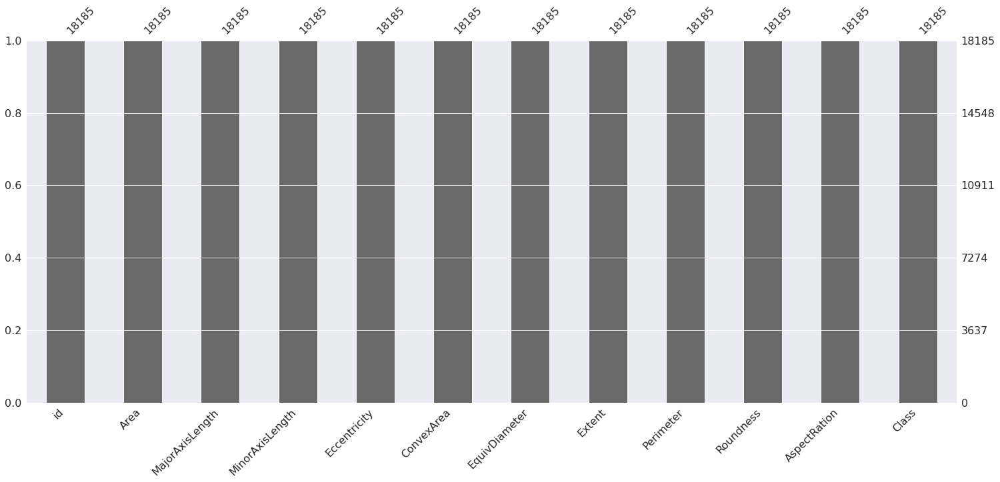

In [ ]:
msno.bar(data)

Checking for Null Values -

In [ ]:
data.isna().sum()

id                 0
Area               0
MajorAxisLength    0
MinorAxisLength    0
Eccentricity       0
ConvexArea         0
EquivDiameter      0
Extent             0
Perimeter          0
Roundness          0
AspectRation       0
Class              0
dtype: int64

In [ ]:
print('Number of duplicate rows: %d' % (data.duplicated().sum()))

Number of duplicate rows: 0


**Univariate Analysis -**

Pie Chart

In [ ]:
d = data.copy()
d["Class"] =  d["Class"].map({1:'Class : 1',0:'Class : 0'})
ex.pie(d,names='Class',title='Rice Classes')

54.9% of the data has class 1 and the remaining 45.1% of the data has class 0. This indicates that the data is balanced.

Count Plot

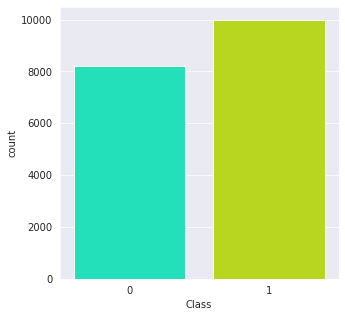

In [ ]:
plt.figure(figsize=(5,5))
colors = ['#04FFCD','#CCF500']
sns.countplot(x='Class',data=data,palette=colors)
plt.show()

In [ ]:
data.groupby("Class").mean()

,id,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation
Class,,,,,,,,,,,
0,13777.018659,8358.541341,153.698425,69.997435,0.888799,8575.295488,102.980173,0.651606,368.966422,0.769776,2.199598
1,5246.334702,5950.784777,150.023778,51.439840,0.937257,6117.583876,86.867333,0.587948,337.350798,0.657264,2.927149


Bar Plot

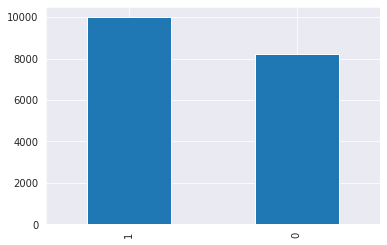

In [ ]:
colors = ['#04FFCD','#CCF500']
data["Class"].value_counts().plot(kind="bar")

3D Scatter Plot

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition  import PCA
N = 5 
pca_pipeline = Pipeline(steps = [
    ('scale',StandardScaler()),
    ('PCA',PCA(N))
])

tf_data = pca_pipeline.fit_transform(data.iloc[:,:9])
tf_data = pd.DataFrame({'PC1':tf_data[:,0],'PC2':tf_data[:,1],'PC3':tf_data[:,2],'PC4':tf_data[:,3],'PC5':tf_data[:,4],
                        'label':data.iloc[:,-1].map({0:'Class 0',1:'Class 1 '})})
ex.scatter_3d(tf_data,x='PC1',y='PC2',z='PC3',color='label',color_discrete_sequence=['blue','yellow'])

Histogram

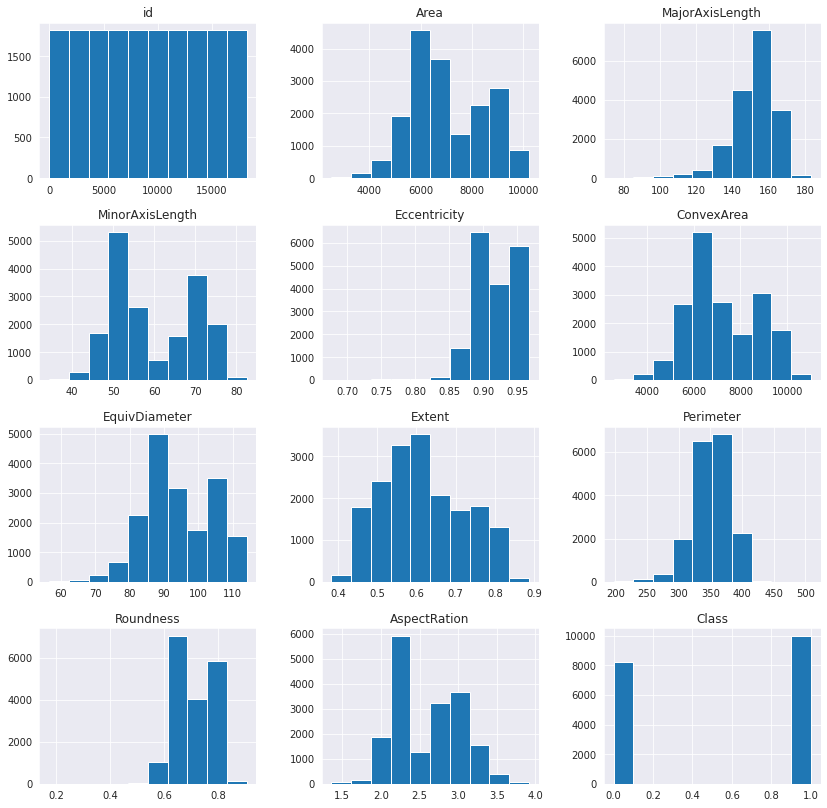

id                 2.755937e+07
Area               2.152667e+06
MajorAxisLength    1.531753e+02
MinorAxisLength    1.012369e+02
Eccentricity       9.348387e-04
ConvexArea         2.256024e+06
EquivDiameter      9.813380e+01
Extent             1.089715e-02
Perimeter          8.702866e+02
Roundness          4.530658e-03
AspectRation       1.890828e-01
Class              2.476049e-01
dtype: float64

In [ ]:
def var_distribution2(dataframe):
    import matplotlib.pyplot as plt
    numbers = pd.Series(dataframe.columns)
    dataframe[numbers].hist(figsize=(14,14))
    plt.show();
    return dataframe.var()
var_distribution2(data)

It is observed that the distribution in most variables resembles Gaussian distribution.

Gaussian distribution (also known as normal distribution) is a bell-shaped curve, and it is assumed that during any measurement values will follow a normal distribution with an equal number of measurements above and below the mean value.

Identifying outliers

In [ ]:
def Outliers(dataframe,cols):
    import plotly.graph_objects as go
    from plotly.subplots import make_subplots
    numeric_col2=[]
    for x in cols:
        numeric_col2.append(x)

    fig=make_subplots(rows=1, cols=len(cols))

    for i,col in enumerate(numeric_col2):
        fig.add_trace(go.Box(y=dataframe[col].values, name=dataframe[col].name), row=1, col=i+1)

    return fig.show()

cols=data.columns.values.tolist()
Outliers(data,cols)

Outliers Variable Distribution using Box Plot

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass t

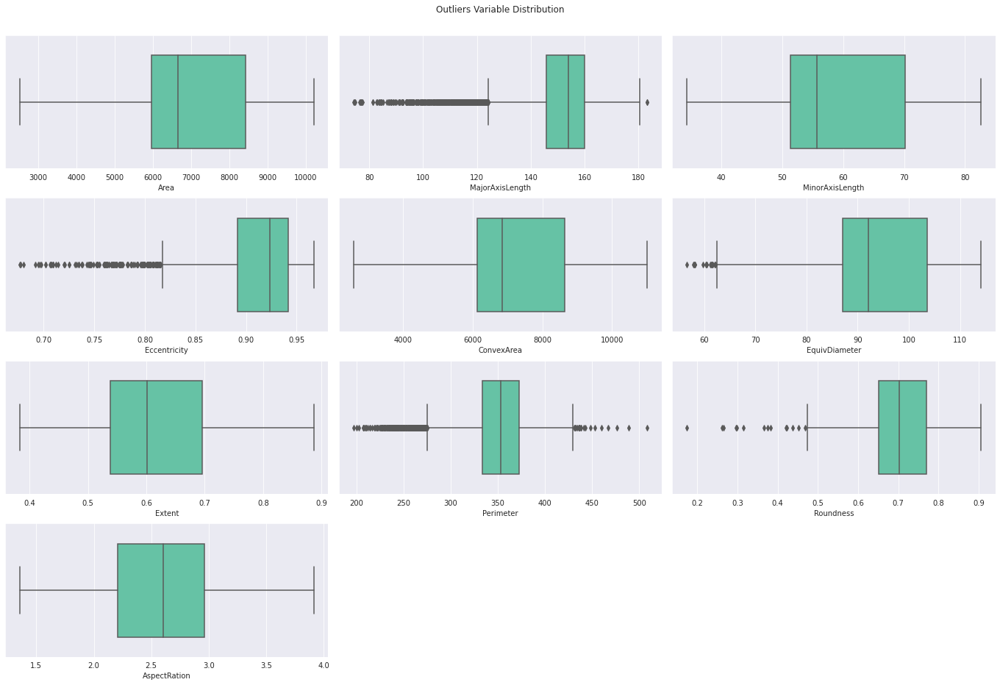

In [ ]:
attributes =['Area','MajorAxisLength',	'MinorAxisLength',	'Eccentricity',	'ConvexArea',	'EquivDiameter',	'Extent',	'Perimeter',	'Roundness',	'AspectRation']

plt.figure(figsize = (19, 19))
for i,j in zip(attributes,range(10)):
  plt.subplot(6, 3, j+1)
  sns.boxplot(data[i], palette="Set2" ,whis=1.5,saturation=1, width=0.7)
plt.suptitle('Outliers Variable Distribution')
plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()

The boxplots suggest that the attributes: MajorAxisLength, Eccentricity, EquivDiameter, Perimeter and Roundness contain abnormally high values. So, we will be removing (statistical) outliers for these attributes.



/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass t

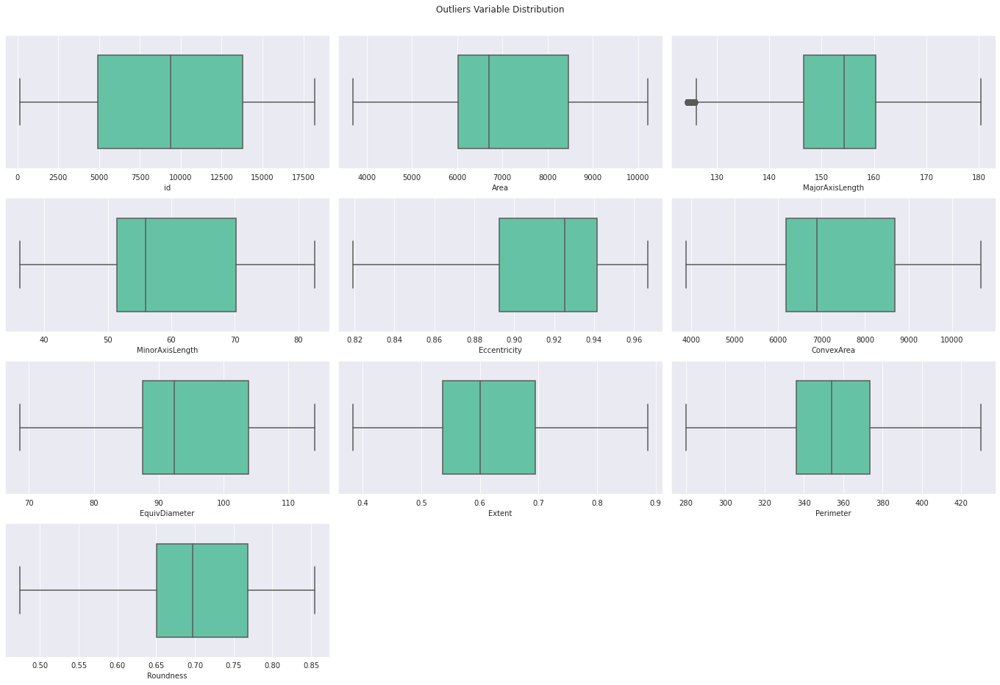

In [ ]:
outliers=['MajorAxisLength',	'Eccentricity',	'EquivDiameter',	'Perimeter',	'Roundness']
for i in outliers: 
  Q1 = data[i].quantile(0.25)
  Q3 = data[i].quantile(0.75)
  IQR = Q3 - Q1
  data = data[(data[i] >= Q1 - 1.5*IQR) & (data[i] <= Q3 + 1.5*IQR)]
  
attributes = data.columns
plt.figure(figsize = (19, 19))
for i,j in zip(attributes,range(10)):
  plt.subplot(6, 3, j+1)
  sns.boxplot(data[i], palette="Set2" ,whis=1.5,saturation=1, width=0.7)
plt.suptitle('Outliers Variable Distribution')
plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()

Heatmap

Class              1.000000
MinorAxisLength    0.919390
Eccentricity       0.903483
Roundness          0.881945
AspectRation       0.880935
Area               0.831670
EquivDiameter      0.829895
ConvexArea         0.829046
id                 0.822464
Perimeter          0.565196
Extent             0.312974
MajorAxisLength    0.120456
Name: Class, dtype: float64

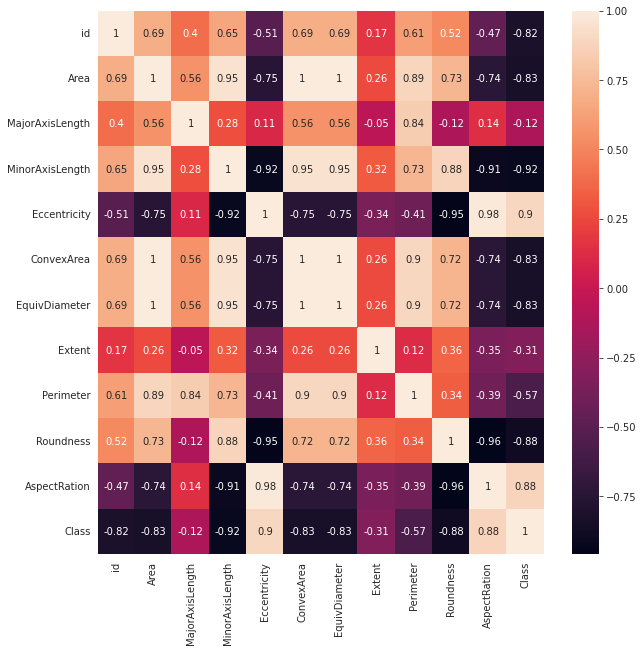

In [ ]:
def corr(dataframe,target_variable):
    import seaborn as sns
    import matplotlib.pyplot as plt
    fig, ax = plt.subplots(figsize=(10,10))
    correlation_matrix = dataframe.corr().round(2)
    sns.heatmap(data=correlation_matrix, annot=True)
    
    correlation = data.corr()[target_variable].abs().sort_values(ascending = False)
    return correlation
corr(data,"Class")

We can see that MinorAxisLength, AspectRation, Roundness, Area, ConvexArea, EquivDiameter and Eccentricity have a very high correlation with the target variable

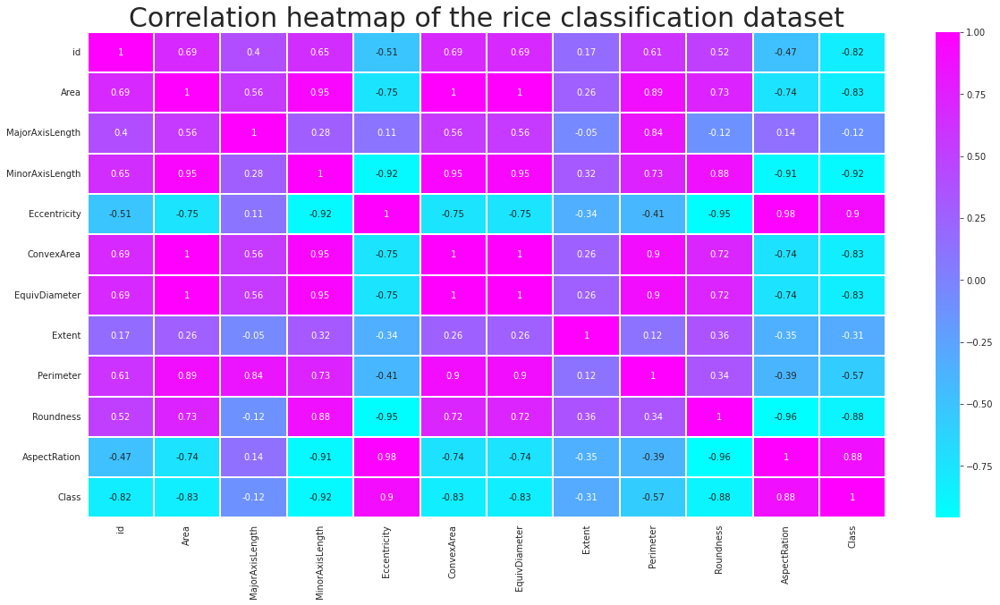

In [ ]:
#Inference from the dataset using heatmap
# Defining the area for plotting the heatmap
fig, ax = plt.subplots(figsize = (20,10))

# Defining and setting the itle for the heatmap
title = 'Correlation heatmap of the rice classification dataset'
plt.title(title, fontsize = 30)
ttl = ax.title

#Plotting the correlation heatmap for the rice classification dataset using .corr() 
#and sns.heatmap() function
sns.heatmap(data.corr(),cbar = True,cmap = 'cool', annot = True, linewidths = 1, ax = ax)
plt.show()

INFERENCE

1. The variable Area is strongly positively correlated to MinorAxisLength, ConvexArea, EquivDiameter, Perimeter

2. MajorAxisLength is strongly positively correlated to Perimeter

3. MinorAxisLength is strongly positively correlated to Area, ConvexArea, EquivDiameter and Roundness

4. MinorAxisLength is strongly negatively correlated to Eccentricity and AspectRation

5. Eccentricity is strongly positively correlated to AspectRation

6. Eccentricity is strongly negatively correlated to Roundness

7. ConvexArea is strongly positively correlated to EquiDiameter and Roundness

8. EquivDiameter is strongly positively correlated to Perimeter

Overall, except Extent feature, all other features are strongly correlated.
Hence in our Binary Classifier model, except Extent we will consider all other features for predicting the label i.e. class of rice

Pair Plot

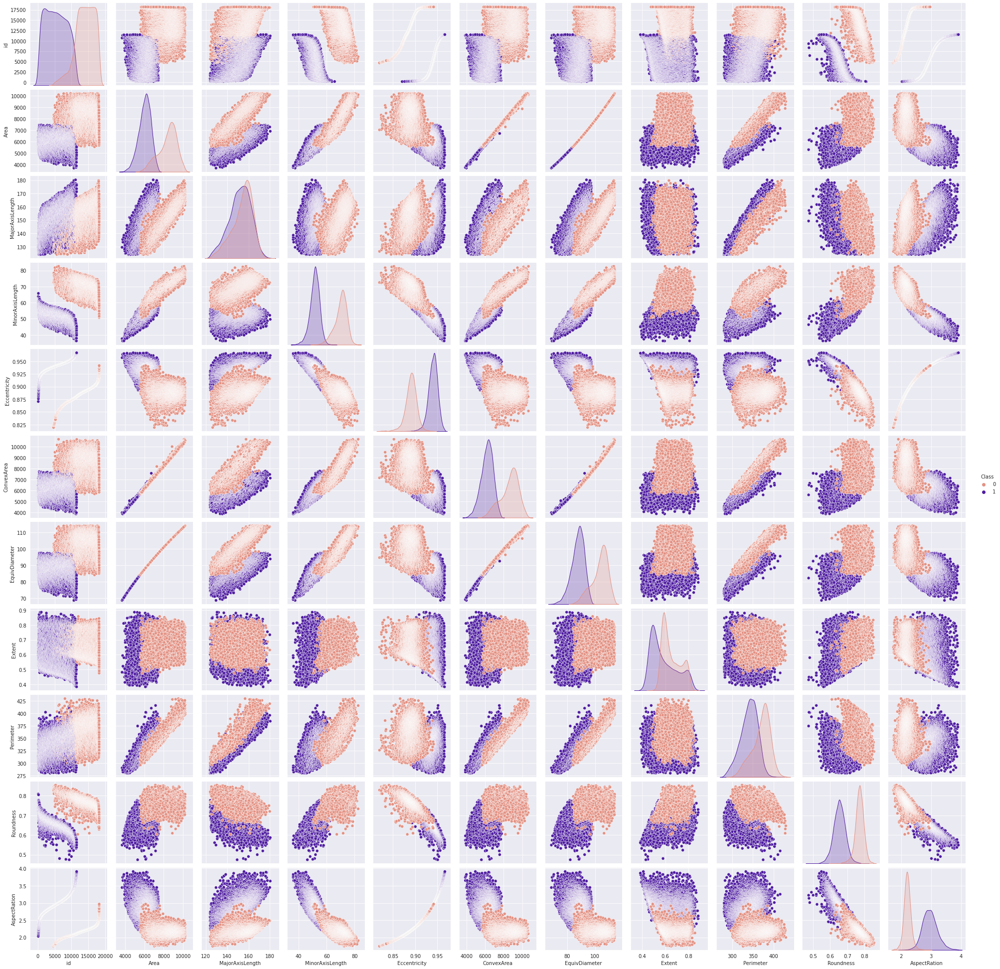

In [ ]:
colors = ["#e39284", "#4f1da1"]
sns.pairplot(data, hue='Class', palette = colors);

**Bivariate Analysis -**

Violin Plot

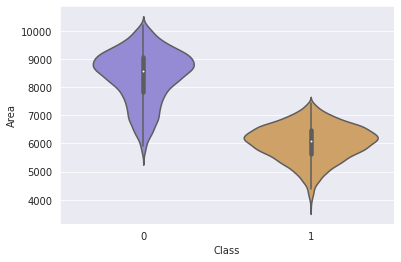

In [ ]:
colors = ["#8c7ee0","#dea357"]
sns.violinplot(x = "Class", y = "Area", data = data, size =8, palette = colors)
plt.show()

Facet Grid

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:337: UserWarning:

The `size` parameter has been renamed to `height`; please update your code.

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



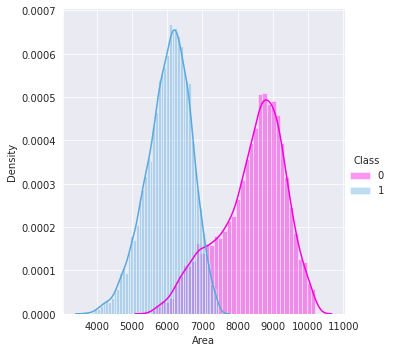

In [ ]:
colors = ["#f502dd", "#57a8de"]
sns.FacetGrid(data, hue = "Class", size = 5, palette = colors).map(sns.distplot, "Area").add_legend()

KDE Plot

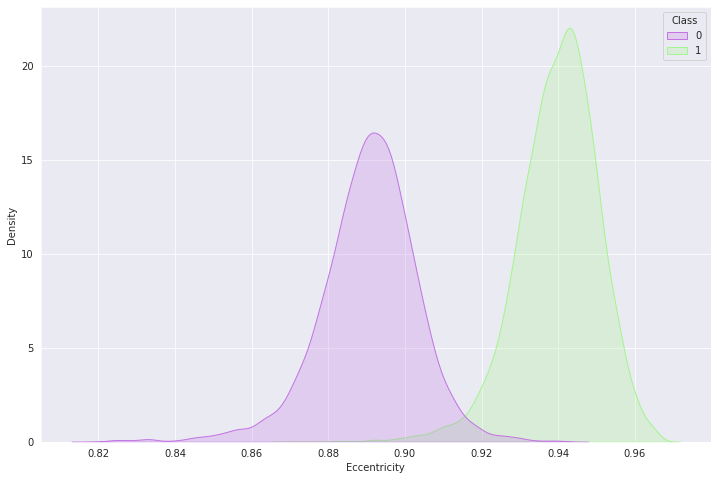

In [ ]:
plt.figure(figsize=(12,8))
colors = ["#c274e3", "#a3f58e"]
sns.kdeplot(data = data, x = 'Eccentricity', hue = 'Class', shade = True, palette = colors)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



AxesSubplot(0.125,0.125;0.775x0.755)


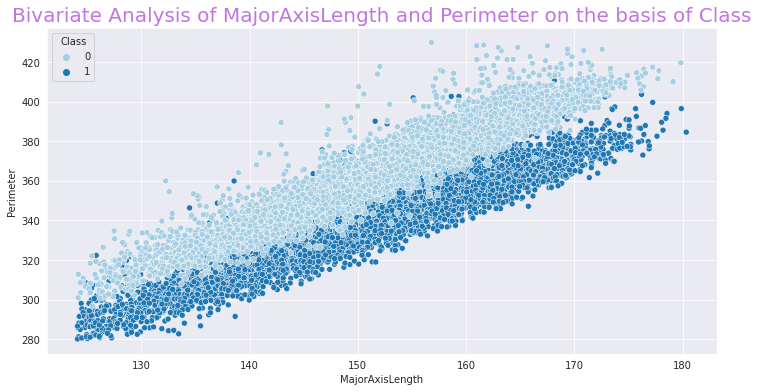

In [ ]:
plt.figure(figsize=(12,6))
plt.title(f"Bivariate Analysis of MajorAxisLength and Perimeter on the basis of Class" , fontsize=20,
          color="#c274e3")
print(sns.scatterplot(data['MajorAxisLength'],data['Perimeter'],hue=data['Class'],palette='Paired',legend='full'))

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



AxesSubplot(0.125,0.125;0.775x0.755)


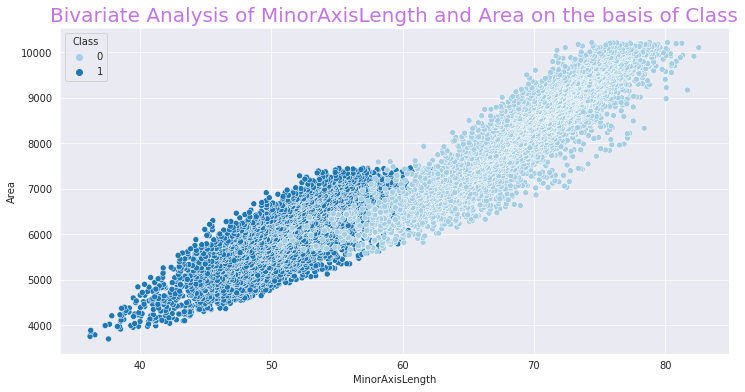

In [ ]:
plt.figure(figsize=(12,6))
plt.title(f"Bivariate Analysis of MinorAxisLength and Area on the basis of Class" , fontsize=20,
          color="#c274e3")
print(sns.scatterplot(data['MinorAxisLength'],data['Area'],hue=data['Class'],palette='Paired',legend='full'))

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



AxesSubplot(0.125,0.125;0.775x0.755)


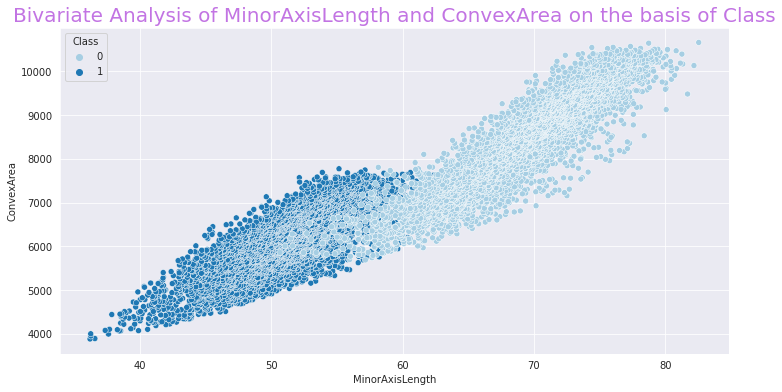

In [ ]:
plt.figure(figsize=(12,6))
plt.title(f"Bivariate Analysis of MinorAxisLength and ConvexArea on the basis of Class" , fontsize=20,
          color="#c274e3")
print(sns.scatterplot(data['MinorAxisLength'],data['ConvexArea'],hue=data['Class'],palette='Paired',legend='full'))

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



AxesSubplot(0.125,0.125;0.775x0.755)


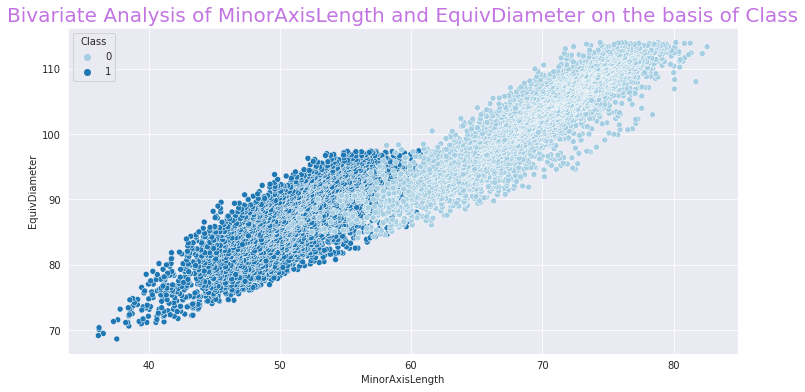

In [ ]:
plt.figure(figsize=(12,6))
plt.title(f"Bivariate Analysis of MinorAxisLength and EquivDiameter on the basis of Class" , fontsize=20,
          color="#c274e3")
print(sns.scatterplot(data['MinorAxisLength'],data['EquivDiameter'],hue=data['Class'],palette='Paired',legend='full'))

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



AxesSubplot(0.125,0.125;0.775x0.755)


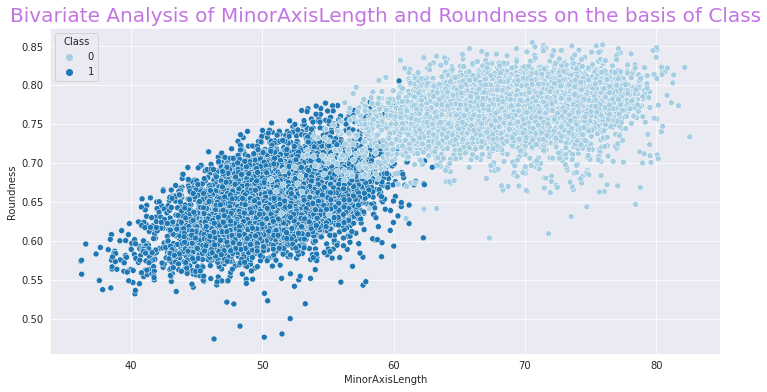

In [ ]:
plt.figure(figsize=(12,6))
plt.title(f"Bivariate Analysis of MinorAxisLength and Roundness on the basis of Class" , fontsize=20,
          color="#c274e3")
print(sns.scatterplot(data['MinorAxisLength'],data['Roundness'],hue=data['Class'],palette='Paired',legend='full'))

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



AxesSubplot(0.125,0.125;0.775x0.755)


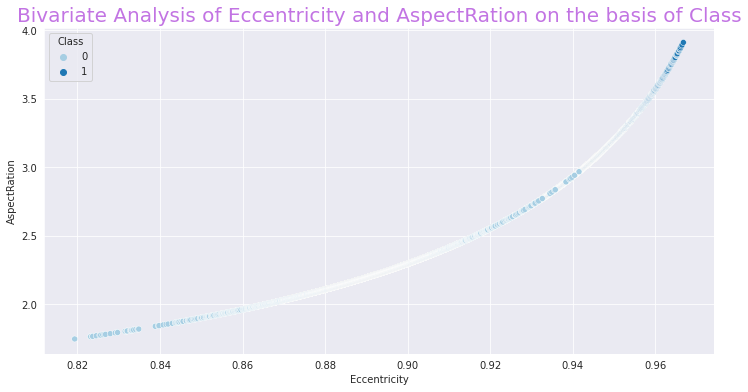

In [ ]:
plt.figure(figsize=(12,6))
plt.title(f"Bivariate Analysis of Eccentricity and AspectRation on the basis of Class" , fontsize=20,
          color="#c274e3")
print(sns.scatterplot(data['Eccentricity'],data['AspectRation'],hue=data['Class'],palette='Paired',legend='full'))

In [ ]:
data.drop(columns=['id'],inplace=True)
data

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation,Class
158,6374,129.576759,63.762307,0.870549,6476,90.086785,0.662234,314.656,0.809003,2.032184,1
186,6946,136.303603,65.738475,0.876009,7115,94.042128,0.594437,338.782,0.760508,2.073422,1
207,5786,125.555431,59.626250,0.880040,5945,85.831020,0.623491,307.304,0.769931,2.105707,1
218,5896,127.013995,59.843292,0.882050,6092,86.643063,0.610352,309.264,0.774655,2.122443,1
227,6082,129.098407,60.416315,0.883736,6204,87.999107,0.661375,308.106,0.805111,2.136814,1
...,...,...,...,...,...,...,...,...,...,...,...
18180,5853,148.624571,51.029281,0.939210,6008,86.326537,0.498594,332.960,0.663444,2.912535,0
18181,7585,169.593996,58.141659,0.939398,7806,98.272692,0.647461,385.506,0.641362,2.916910,0
18182,6365,154.777085,52.908085,0.939760,6531,90.023162,0.561287,342.253,0.682832,2.925396,0
18183,5960,151.397924,51.474600,0.940427,6189,87.112041,0.492399,343.371,0.635227,2.941216,0


In [20]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18185 entries, 0 to 18184
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               18185 non-null  int64  
 1   Area             18185 non-null  int64  
 2   MajorAxisLength  18185 non-null  float64
 3   MinorAxisLength  18185 non-null  float64
 4   Eccentricity     18185 non-null  float64
 5   ConvexArea       18185 non-null  int64  
 6   EquivDiameter    18185 non-null  float64
 7   Extent           18185 non-null  float64
 8   Perimeter        18185 non-null  float64
 9   Roundness        18185 non-null  float64
 10  AspectRation     18185 non-null  float64
 11  Class            18185 non-null  int64  
dtypes: float64(8), int64(4)
memory usage: 1.7 MB


In [23]:
df = data.drop('id', axis=1)

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18185 entries, 0 to 18184
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             18185 non-null  int64  
 1   MajorAxisLength  18185 non-null  float64
 2   MinorAxisLength  18185 non-null  float64
 3   Eccentricity     18185 non-null  float64
 4   ConvexArea       18185 non-null  int64  
 5   EquivDiameter    18185 non-null  float64
 6   Extent           18185 non-null  float64
 7   Perimeter        18185 non-null  float64
 8   Roundness        18185 non-null  float64
 9   AspectRation     18185 non-null  float64
 10  Class            18185 non-null  int64  
dtypes: float64(8), int64(3)
memory usage: 1.5 MB


**ML Model**

https://www.kaggle.com/code/davegn/rice-type-classification#6.-Model-Evlaution

In [25]:
X = df.drop('Class', axis=1)
y = df['Class']

In [26]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [27]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [28]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

Model Imports

In [29]:
pip install catboost

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [30]:
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier, XGBRFClassifier
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier

Baseline Model Scores

In [31]:
def fit_and_score(models, X_train, X_test, y_train, y_test):
    np.random.seed(42)
    
    model_scores = {}
    
    for name, model in models.items():
        model.fit(X_train,y_train)
        model_scores[name] = model.score(X_test,y_test)

    model_scores = pd.DataFrame(model_scores, index=['Score']).transpose()
    model_scores = model_scores.sort_values('Score')
        
    return model_scores

In [32]:
models = {'LogisticRegression': LogisticRegression(max_iter=10000),
          'KNeighborsClassifier': KNeighborsClassifier(),
          'SVC': SVC(),
          'DecisionTreeClassifier': DecisionTreeClassifier(),
          'RandomForestClassifier': RandomForestClassifier(),
          'AdaBoostClassifier': AdaBoostClassifier(),
          'GradientBoostingClassifier': GradientBoostingClassifier(),
          'XGBClassifier': XGBClassifier(),
          'XGBRFClassifier': XGBRFClassifier(),
          'CatBoostClassifier': CatBoostClassifier(),
          'LGBMClassifier':LGBMClassifier()}

In [33]:
baseline_model_scores = fit_and_score(models, X_train, X_test, y_train, y_test)

Learning rate set to 0.030527
0:	learn: 0.6144543	total: 34.2ms	remaining: 34.1s
1:	learn: 0.5447826	total: 61.8ms	remaining: 30.8s
2:	learn: 0.4819635	total: 83.5ms	remaining: 27.7s
3:	learn: 0.4258669	total: 102ms	remaining: 25.4s
4:	learn: 0.3773393	total: 138ms	remaining: 27.4s
5:	learn: 0.3415578	total: 155ms	remaining: 25.7s
6:	learn: 0.3124938	total: 176ms	remaining: 25s
7:	learn: 0.2821653	total: 201ms	remaining: 25s
8:	learn: 0.2553591	total: 223ms	remaining: 24.5s
9:	learn: 0.2318164	total: 245ms	remaining: 24.3s
10:	learn: 0.2086128	total: 269ms	remaining: 24.1s
11:	learn: 0.1881790	total: 283ms	remaining: 23.3s
12:	learn: 0.1686570	total: 293ms	remaining: 22.2s
13:	learn: 0.1559633	total: 304ms	remaining: 21.4s
14:	learn: 0.1409293	total: 314ms	remaining: 20.6s
15:	learn: 0.1277682	total: 322ms	remaining: 19.8s
16:	learn: 0.1169917	total: 331ms	remaining: 19.1s
17:	learn: 0.1082818	total: 338ms	remaining: 18.4s
18:	learn: 0.1000007	total: 347ms	remaining: 17.9s
19:	learn: 0

In [34]:
baseline_model_scores.sort_values('Score')

,Score
DecisionTreeClassifier,0.984238
XGBRFClassifier,0.987903
AdaBoostClassifier,0.988636
KNeighborsClassifier,0.989186
RandomForestClassifier,0.989186
GradientBoostingClassifier,0.989553
CatBoostClassifier,0.990103
SVC,0.990286
LGBMClassifier,0.990286
XGBClassifier,0.990469


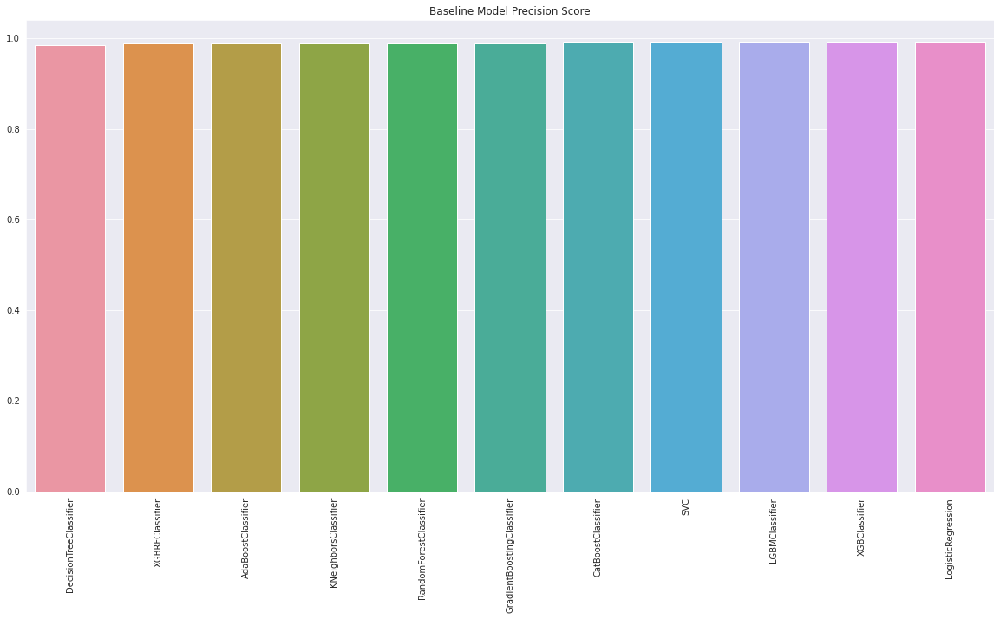

In [35]:
plt.figure(figsize=(20,10))
sns.barplot(data=baseline_model_scores.sort_values('Score').T)
plt.title('Baseline Model Precision Score')
plt.xticks(rotation=90);

The best performing model is LogisticRegression at 0.990836, and SVC at 0.990286 let look to improve it via a Random search CV and grid Search CV

Random Search CV

In [36]:
from sklearn.model_selection import RandomizedSearchCV

In [37]:
def randomsearch_cv_scores(models, params, X_train, X_test, y_train, y_test):
    np.random.seed(42)
    
    model_rs_scores = {}
    model_rs_best_param = {}
    
    for name, model in models.items():
        rs_model = RandomizedSearchCV(model,
                                     param_distributions=params[name],
                                      cv=5,
                                     n_iter=20,n_jobs=-1,
                                     verbose=2)        
        rs_model.fit(X_train,y_train)
        model_rs_scores[name] = rs_model.score(X_test,y_test)
        model_rs_best_param[name] = rs_model.best_params_
        
    return model_rs_scores, model_rs_best_param

RS Model 1

In [38]:
models = {'LogisticRegression': LogisticRegression(max_iter=10000),
         'SVC': SVC()}
params = {'LogisticRegression':{'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
                                'penalty':['none','l1','l2','elasticnet'],
                                'C': [0.01,0.1,1,10,100],
                                'l1_ratio':[0,1,5,10,50,100]},
          'SVC':{'C': [0.1,0.5,1, 10,100,500], 
              'kernel':['linear', 'poly', 'rbf','sigmoid'],
              'gamma':['scale','auto'],
              'degree':[2,3,4]}
         }

In [39]:
model_rs_scores_1, model_rs_best_param_1 = randomsearch_cv_scores(models, params, X_train, X_test, y_train, y_test)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:372: FitFailedWarning:


40 fits failed out of a total of 100.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py", line 1473, in fit
    % self.l1_ratio
ValueError: l1_ratio must be between 0 and 1; got (l1_ratio=5)

--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (

Fitting 5 folds for each of 20 candidates, totalling 100 fits


In [40]:
model_rs_scores_1

{'LogisticRegression': 0.9908357771260997, 'SVC': 0.9913856304985337}

In [41]:
model_rs_best_param_1

{'LogisticRegression': {'solver': 'saga',
  'penalty': 'l1',
  'l1_ratio': 100,
  'C': 10},
 'SVC': {'kernel': 'rbf', 'gamma': 'auto', 'degree': 2, 'C': 100}}

RS Model 2

In [42]:
params = {'LogisticRegression':{'solver': ['saga'],
                                'penalty':['l1'],
                                'C': [5,10,20,30,40],
                               'l1_ratio':[80,90,100,120,150]},
          'SVC': {'C': [80,90,100,120,150], 
              'kernel':['rbf'],
              'gamma':['auto'],
              'degree':[1,2,3]}
         }

In [44]:
model_rs_scores_2, model_rs_best_param_2 = randomsearch_cv_scores(models, params, X_train, X_test, y_train, y_test)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:1479: UserWarning:

l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_search.py:296: UserWarning:

The total space of parameters 15 is smaller than n_iter=20. Running 15 iterations. For exhaustive searches, use GridSearchCV.



Fitting 5 folds for each of 15 candidates, totalling 75 fits


In [45]:
model_rs_scores_2

{'LogisticRegression': 0.9904692082111437, 'SVC': 0.9913856304985337}

In [46]:
model_rs_best_param_2

{'LogisticRegression': {'solver': 'saga',
  'penalty': 'l1',
  'l1_ratio': 80,
  'C': 5},
 'SVC': {'kernel': 'rbf', 'gamma': 'auto', 'degree': 1, 'C': 100}}

RS Model 3

In [47]:
params = {'LogisticRegression':{'solver': ['saga'],
                                'penalty':['l1'],
                                'C': [3,4,5,6,7,8,9],
                               'l1_ratio':[70,75,80, 85]},
          'SVC': {'C': [95,100,105,110], 
              'kernel':['rbf'],
              'gamma':['auto'],
              'degree':[1,2]}
         }

In [48]:
model_rs_scores_3, model_rs_best_param_3 = randomsearch_cv_scores(models, params, X_train, X_test, y_train, y_test)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:1479: UserWarning:

l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_search.py:296: UserWarning:

The total space of parameters 8 is smaller than n_iter=20. Running 8 iterations. For exhaustive searches, use GridSearchCV.



Fitting 5 folds for each of 8 candidates, totalling 40 fits


In [49]:
model_rs_scores_3

{'LogisticRegression': 0.9904692082111437, 'SVC': 0.9913856304985337}

In [50]:
model_rs_scores_2

{'LogisticRegression': 0.9904692082111437, 'SVC': 0.9913856304985337}

In [51]:
model_rs_best_param_3

{'LogisticRegression': {'solver': 'saga',
  'penalty': 'l1',
  'l1_ratio': 75,
  'C': 5},
 'SVC': {'kernel': 'rbf', 'gamma': 'auto', 'degree': 1, 'C': 105}}

Model does not seem to be improving with the given hyperparameters. we will use the SVC to bulid the model and evaluate it.

Model Evaluation

In [52]:
from sklearn.metrics import classification_report, plot_confusion_matrix, plot_roc_curve 
from sklearn.model_selection import cross_val_score

In [53]:
model = SVC(kernel='rbf', gamma='auto', degree=1,C=105)
model.fit(X_train, y_train)
y_preds = model.predict(X_test)

SVC
Classification Report

In [54]:
print(classification_report(y_test,y_preds))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99      2447
           1       0.99      0.99      0.99      3009

    accuracy                           0.99      5456
   macro avg       0.99      0.99      0.99      5456
weighted avg       0.99      0.99      0.99      5456



Confusion matrix

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



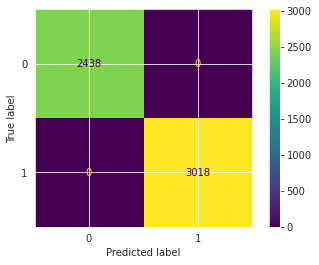

In [55]:
plot_confusion_matrix(model, X_test,y_preds)

ROC Curve

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.



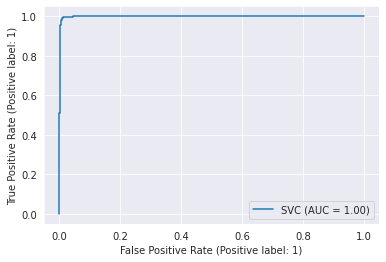

In [56]:
plot_roc_curve(model, X_test, y_test);

Evalution using cross-validation

In [57]:
def get_cv_score(model, X, y, cv=5):
    
    
    cv_accuracy = cross_val_score(model,X,y,cv=5,
                         scoring='accuracy')
    print(f'Cross Validaion accuracy Scores: {cv_accuracy}')
    print(f'Cross Validation accuracy Mean Score: {cv_accuracy.mean()}')
    
    cv_precision = cross_val_score(model,X,y,cv=5,
                         scoring='precision')
    print(f'Cross Validaion precision Scores: {cv_precision}')
    print(f'Cross Validation precision Mean Score: {cv_precision.mean()}')
    
    cv_recall = cross_val_score(model,X,y,cv=5,
                         scoring='recall')
    print(f'Cross Validaion recall Scores: {cv_recall}')
    print(f'Cross Validation recall Mean Score: {cv_recall.mean()}')
    
    cv_f1 = cross_val_score(model,X,y,cv=5,
                         scoring='f1')
    print(f'Cross Validaion f1 Scores: {cv_f1}')
    print(f'Cross Validation f1 Mean Score: {cv_f1.mean()}')   
    
    cv_merics = pd.DataFrame({'Accuracy': cv_accuracy.mean(),
                         'Precision': cv_precision.mean(),
                         'Recall': cv_recall.mean(),
                         'f1': cv_recall.mean()},index=[0])
    
    return cv_merics


In [58]:
cv_merics = get_cv_score(model, X, y, cv=5)

Cross Validaion accuracy Scores: [0.57025021 0.61754193 0.63046467 0.62414078 0.57904867]
Cross Validation accuracy Mean Score: 0.6042892493813582
Cross Validaion precision Scores: [0.56126482 0.58948612 0.59778377 0.59363853 0.56604308]
Cross Validation precision Mean Score: 0.5816432637018665
Cross Validaion recall Scores: [0.99549324 0.99949925 0.99949925 1.         1.        ]
Cross Validation recall Mean Score: 0.9988983475212819
Cross Validaion f1 Scores: [0.7178191  0.74159391 0.74812594 0.74501026 0.72289593]
Cross Validation f1 Mean Score: 0.7350890263154949


In [59]:
cv_merics

,Accuracy,Precision,Recall,f1
0,0.604289,0.581643,0.998898,0.998898


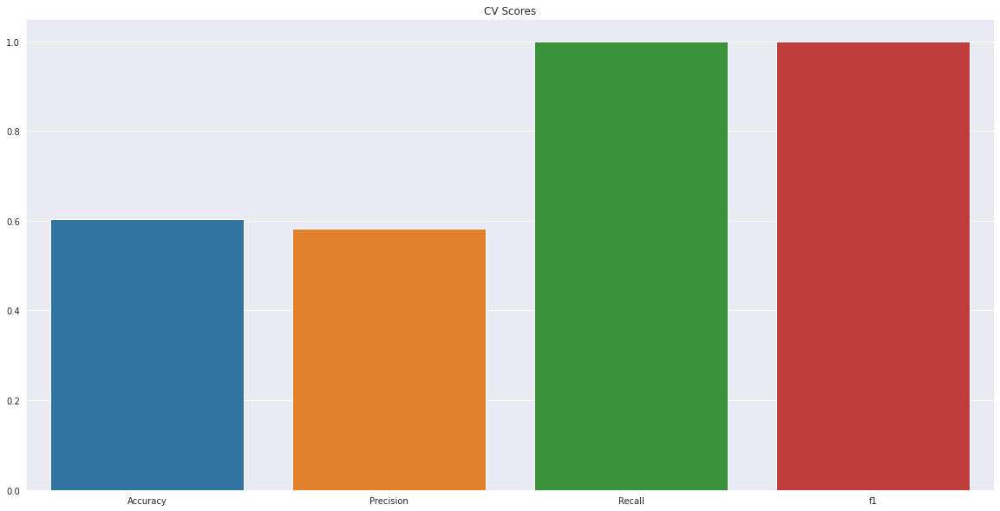

In [60]:
plt.figure(figsize=(20,10))
plt.title('CV Scores')
sns.barplot(data=cv_merics);

After the CV is done, it seem either the model is overfitted or is not suitable. we will try with the logistic Regression model instead

Logistic Regression

In [61]:
model = LogisticRegression(solver='saga', penalty='l1',C=5,max_iter=10000)
model.fit(X_train, y_train)
y_preds = model.predict(X_test)

Classification Report

In [62]:
print(classification_report(y_test,y_preds))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99      2447
           1       0.99      0.99      0.99      3009

    accuracy                           0.99      5456
   macro avg       0.99      0.99      0.99      5456
weighted avg       0.99      0.99      0.99      5456



Confusion matrix

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



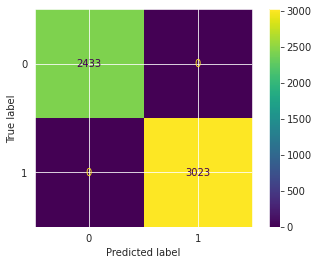

In [63]:
plot_confusion_matrix(model, X_test,y_preds)

ROC Curve

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.



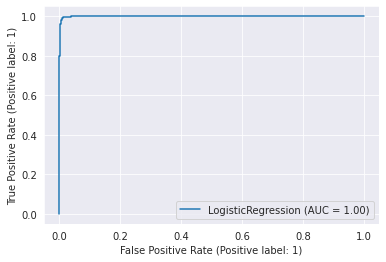

In [64]:
plot_roc_curve(model, X_test, y_test);

Evalution using cross-validation

In [65]:
cv_merics = get_cv_score(model, X, y, cv=5)

Cross Validaion accuracy Scores: [0.96838053 0.9931262  0.99615067 0.9920264  0.95215837]
Cross Validation accuracy Mean Score: 0.9803684355237833
Cross Validaion precision Scores: [0.99735729 0.99250749 0.99303829 0.98568608 0.9198526 ]
Cross Validation precision Mean Score: 0.9776883518439362
Cross Validaion recall Scores: [0.94491738 0.99499249 1.         1.         1.        ]
Cross Validation recall Mean Score: 0.9879819729594391
Cross Validaion f1 Scores: [0.97042942 0.99374844 0.99650699 0.99279145 0.95825336]
Cross Validation f1 Mean Score: 0.982345929506409


In [66]:
cv_merics

,Accuracy,Precision,Recall,f1
0,0.980368,0.977688,0.987982,0.987982


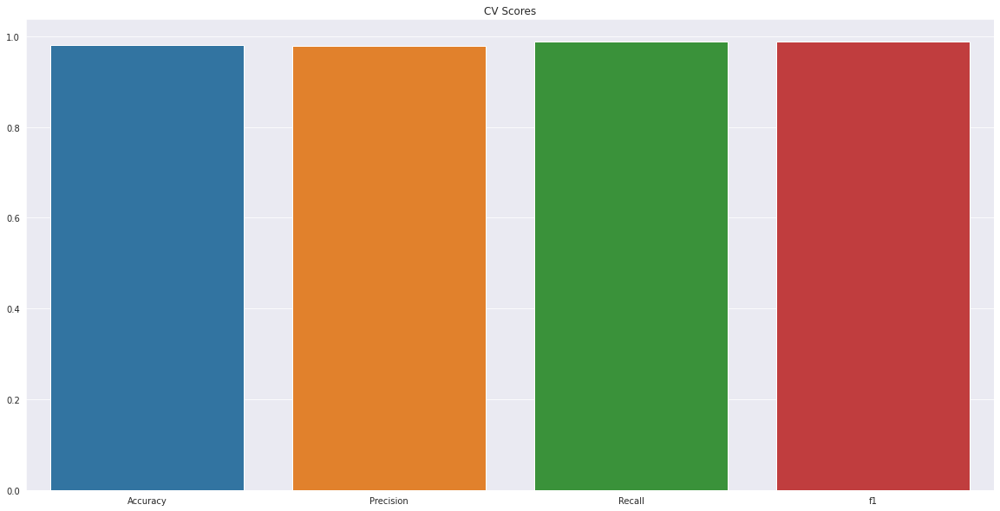

In [67]:
plt.figure(figsize=(20,10))
plt.title('CV Scores')
sns.barplot(data=cv_merics);

With the failer of the SVC model on the CV evalution, we will build the model using the Logistic Regression. with a mean CV score of:

* Accuracy: 0.980368
* Precision: 0.977688   
* Recall: 0.987982
* f1: 0.987982